# <span style="color:green"><center>Diplomado en Inteligencia Artificial y Aprendizaje Profundo</center></span>

# <span style="color:red"><center>Redes Neuronales Modernas</center></span>

##   <span style="color:blue">Profesores</span>

1. Alvaro Mauricio Montenegro Díaz, ammontenegrod@unal.edu.co
2. Daniel Mauricio Montenegro Reyes, dextronomo@gmail.com 
3. Campo Elías Pardo Turriago, cepardot@unal.edu.co 

##   <span style="color:blue">Asesora Medios y Marketing digital</span>
 

4. Maria del Pilar Montenegro, pmontenegro88@gmail.com 

## <span style="color:blue">Asistentes</span>

5. Oleg Jarma, ojarmam@unal.edu.co 
6. Laura Lizarazo, ljlizarazore@unal.edu.co 

## <span style="color:blue">Contenido</span>

* [Aprendizaje Profundo](#Aprendizaje-Profundo)
* [Redes Profundas Modernas](#edes-Profundas-Modernas)
* [Importar librerías Necesaria](#Importar-librerías-Necesarias)
* [VGG16](#VGG16)
* [Cargar Modelo Pre-entrenado](#Cargar-Modelo-Pre-entrenado)
* [Estructura del Modelo](#Estructura-del-Modelo)
* [Obteniendo Datos](#Obteniendo-Datos)
* [Utilizando el Modelo](#Utilizando-el-Modelo)
* [Predecir Imagen](#Predecir-Imagen)
* [VGG19](#VGG19)
* [InceptionV3](#InceptionV3)
* [MobileNetV3](#MobileNetV3)
* [Predicciones usando OpenCV](#Predicciones-usando-OpenCV)

## <span style="color:blue">Referencias</span>

- [Keras Applications](https://keras.io/api/applications/)
- [Deep learning Wiki](https://en.wikipedia.org/wiki/Deep_learning)
- [Deep Learning IBM](https://www.ibm.com/cloud/learn/deep-learning)

## <span style="color:blue">Aprendizaje Profundo</span>

Concepto de Aprendizaje Profundo

[[Volver]](#Contenido)

## <span style="color:blue">Redes Profundas Modernas</span>

Lista de Redes Profundas

[[Volver]](#Contenido)

### <span style="color:blue">Importar librerías Necesarias</span>

In [1]:
# Redes Modernas disponibles en Keras
import tensorflow.keras.applications
# Módul de keras para preprocesamiento
from tensorflow.keras.preprocessing import image
# Topología del modelo
from tensorflow.keras.utils import plot_model
# Dibujitos
import matplotlib.pyplot as plt
# Manipular tensores
import numpy as np
# Acceder a datos en internet
import requests

In [2]:
dir(tensorflow.keras.applications)

['DenseNet121',
 'DenseNet169',
 'DenseNet201',
 'EfficientNetB0',
 'EfficientNetB1',
 'EfficientNetB2',
 'EfficientNetB3',
 'EfficientNetB4',
 'EfficientNetB5',
 'EfficientNetB6',
 'EfficientNetB7',
 'InceptionResNetV2',
 'InceptionV3',
 'MobileNet',
 'MobileNetV2',
 'MobileNetV3Large',
 'MobileNetV3Small',
 'NASNetLarge',
 'NASNetMobile',
 'ResNet101',
 'ResNet101V2',
 'ResNet152',
 'ResNet152V2',
 'ResNet50',
 'ResNet50V2',
 'VGG16',
 'VGG19',
 'Xception',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_sys',
 'densenet',
 'efficientnet',
 'imagenet_utils',
 'inception_resnet_v2',
 'inception_v3',
 'mobilenet',
 'mobilenet_v2',
 'mobilenet_v3',
 'nasnet',
 'resnet',
 'resnet50',
 'resnet_v2',
 'vgg16',
 'vgg19',
 'xception']

[[Volver]](#Contenido)

## <span style="color:blue">VGG16</span>

In [3]:
dir(tensorflow.keras.applications.vgg16)

['VGG16',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_sys',
 'decode_predictions',
 'preprocess_input']

In [4]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input,decode_predictions

[[Volver]](#Contenido)

## <span style="color:blue">Cargar Modelo Pre-entrenado </span>

In [5]:
model = VGG16(weights='imagenet', include_top=True)

553467904/553467096 [==============================] - 135s 0us/step


Podemos observar que se ha efectuado una descarga desde internet.

> **El modelo quedará guardado en el directorio** `~/.keras/models/`:

In [6]:
!ls ~/.keras/models

vgg16_weights_tf_dim_ordering_tf_kernels.h5


[[Volver]](#Contenido)

## <span style="color:blue">Estructura del Modelo</span>

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

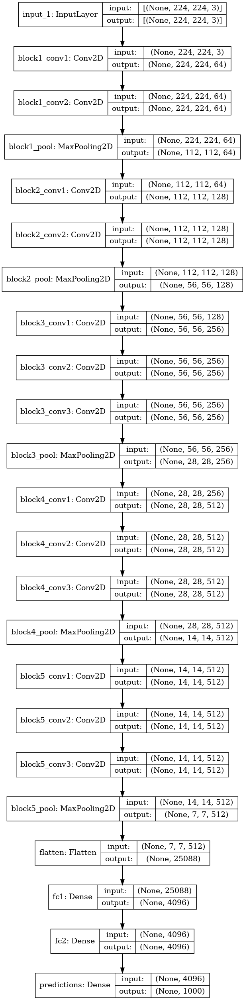

In [7]:
model.summary()
plot_model(model, to_file='../Imagenes/VGG16.png', show_shapes=True)

[[Volver]](#Contenido)

## <span style="color:blue">Obteniendo Data</span>

In [8]:
import requests

url = "https://www.worldatlas.com/r/w2000-h1125-q90/upload/85/05/e8/african-elephant.jpg"

r = requests.get(url)
with open("../Data/african-elephant.jpg", "wb") as f:
    f.write(r.content)

[[Volver]](#Contenido)

## <span style="color:blue">Utilizando el Modelo</span>

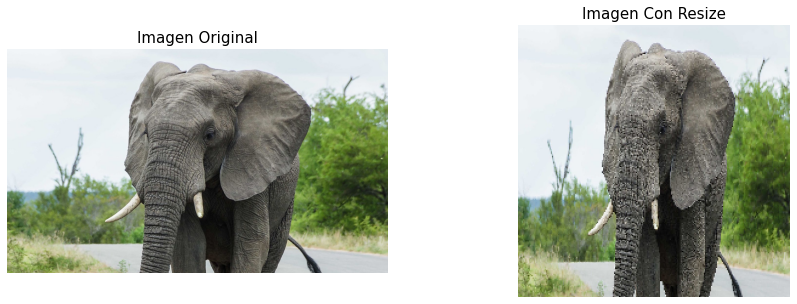

In [9]:
# Ruta de la Imagen
img_path = '../Data/african-elephant.jpg'

# Cargar Imagen
img = image.load_img(img_path)

# Visualizar Imagen
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Original",fontsize=15)


# Cargar Imagen con resize (Para la Red)
img = image.load_img(img_path,target_size=(224,224))

# Visualizar Imagen
plt.subplot(122)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Con Resize",fontsize=15)
plt.show()

# Convertir a tensor
x = image.img_to_array(img)
# Expandir dimensión para forma de la red
x = np.expand_dims(x, axis=0)
# Preprocesarmiento del input para ayudar a la red
x = preprocess_input(x)
# Predicciones (Vector de probabilidades)
features = model.predict(x)

[[Volver]](#Contenido)

## <span style="color:blue">Predecir Imagen</span>

In [10]:
clase=np.argmax(features)
print("Número de clase de la imagen predicha",clase,'\n')
que_es=decode_predictions(features)
que_es

Número de clase de la imagen predicha 101 

40960/35363 [==================================] - 0s 0us/step


[[('n01871265', 'tusker', 0.53101975),
  ('n02504458', 'African_elephant', 0.33730116),
  ('n02504013', 'Indian_elephant', 0.13159615),
  ('n02437312', 'Arabian_camel', 1.6697217e-05),
  ('n02963159', 'cardigan', 1.640271e-05)]]

[[Volver]](#Contenido)

## <span style="color:blue">VGG19</span>

In [11]:
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input,decode_predictions

In [12]:
VGG19 = VGG19()

574717952/574710816 [==============================] - 331s 1us/step


In [13]:
!ls ~/.keras/models

imagenet_class_index.json
vgg16_weights_tf_dim_ordering_tf_kernels.h5
vgg19_weights_tf_dim_ordering_tf_kernels.h5


Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

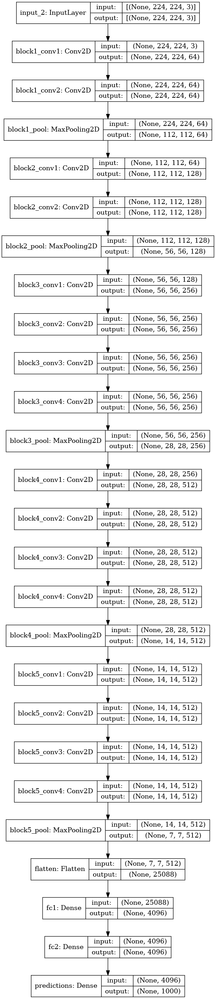

In [14]:
VGG19.summary()
plot_model(VGG19, to_file='../Imagenes/VGG19.png', show_shapes=True)

In [20]:

import requests

url = """https://github.com/AprendizajeProfundo/Diplomado/blob/master/Temas/M%C3%B3dulo%207-%20Aprendizaje%20Profundo%20I/3.%20Tratamiendo%20de%20im%C3%A1genes/Imagenes/Zeus.jpg?raw=true"""

r = requests.get(url)
with open("../Data/Zeus.jpg", "wb") as f:
    f.write(r.content)

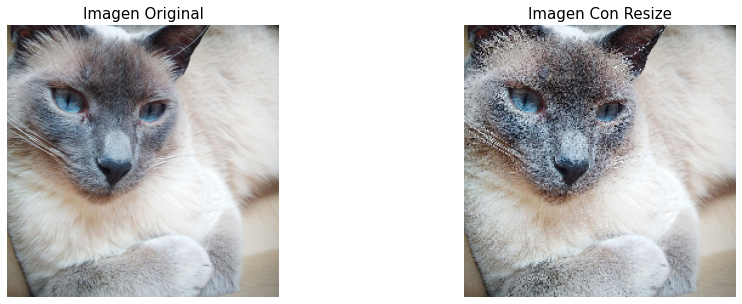

Número de clase de la imagen predicha 284 



[[('n02123597', 'Siamese_cat', 0.83312947),
  ('n01877812', 'wallaby', 0.049514163),
  ('n01882714', 'koala', 0.031503413),
  ('n02124075', 'Egyptian_cat', 0.026201747),
  ('n02127052', 'lynx', 0.019342285)]]

In [21]:
# Ruta de la Imagen
# african-elephant.jpg # Check it improves accuracy
img_path = '../Data/Zeus.jpg'

# Cargar Imagen
img = image.load_img(img_path)

# Visualizar Imagen
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Original",fontsize=15)


# Cargar Imagen con resize (Para la Red)
img = image.load_img(img_path,target_size=(224,224))

# Visualizar Imagen
plt.subplot(122)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Con Resize",fontsize=15)
plt.show()

# Convertir a tensor
x = image.img_to_array(img)
# Expandir dimensión para forma de la red
x = np.expand_dims(x, axis=0)
# Preprocesarmiento del input para ayudar a la red
x = preprocess_input(x)
# Predicciones (Vector de probabilidades)
features = VGG19.predict(x)
# Número de clase
clase=np.argmax(features)
print("Número de clase de la imagen predicha",clase,'\n')
# Qué objeto es
que_es=decode_predictions(features)
que_es

[[Volver]](#Contenido)

## <span style="color:blue">InceptionV3</span>

In [22]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input,decode_predictions

In [23]:
IV3 = InceptionV3()

96116736/96112376 [==============================] - 53s 1us/step


In [24]:
!ls ~/.keras/models

imagenet_class_index.json
inception_v3_weights_tf_dim_ordering_tf_kernels.h5
vgg16_weights_tf_dim_ordering_tf_kernels.h5
vgg19_weights_tf_dim_ordering_tf_kernels.h5


In [25]:
IV3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [26]:
plot_model(IV3, to_file='../Imagenes/IV3.png', show_shapes=True)

In [27]:
import requests

url = "https://github.com/AprendizajeProfundo/Diplomado/blob/master/Temas/M%C3%B3dulo%207-%20Aprendizaje%20Profundo%20I/3.%20Tratamiendo%20de%20im%C3%A1genes/Imagenes/Mila.jpg?raw=true"
r = requests.get(url)
with open("../Data/Mila.jpg", "wb") as f:
    f.write(r.content)

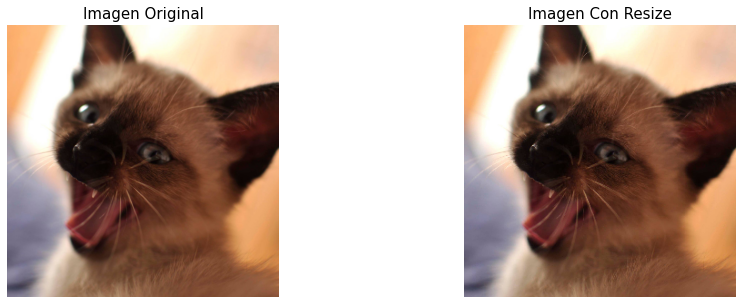

Número de clase de la imagen predicha 284 



[[('n02123597', 'Siamese_cat', 0.83834875),
  ('n02123394', 'Persian_cat', 0.023453439),
  ('n03325584', 'feather_boa', 0.0069200913),
  ('n03908714', 'pencil_sharpener', 0.0010726391),
  ('n04553703', 'washbasin', 0.0010579348)]]

In [29]:
# Ruta de la Imagen
img_path = '../Data/Mila.jpg'

# Cargar Imagen
img = image.load_img(img_path)

# Visualizar Imagen
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Original",fontsize=15)


# Cargar Imagen con resize (Para la Red)
img = image.load_img(img_path,target_size=(299,299))

# Visualizar Imagen
plt.subplot(122)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Con Resize",fontsize=15)
plt.show()

# Convertir a tensor
x = image.img_to_array(img)
# Expandir dimensión para forma de la red
x = np.expand_dims(x, axis=0)
# Preprocesarmiento del input para ayudar a la red
x = preprocess_input(x)
# Predicciones (Vector de probabilidades)
features = IV3.predict(x)
# Número de clase
clase=np.argmax(features)
print("Número de clase de la imagen predicha",clase,'\n')
# Qué objeto es
que_es=decode_predictions(features)
que_es

[[Volver]](#Contenido)

## <span style="color:blue">MobileNetV3</span>

Para entender a profundidad esta red, recomendamos el artículo

[Everything you need to know about MobileNetV3](https://towardsdatascience.com/everything-you-need-to-know-about-mobilenetv3-and-its-comparison-with-previous-versions-a5d5e5a6eeaa)

In [30]:
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input, decode_predictions

mnet_v3 = MobileNetV3Large(weights='imagenet', include_top=True,input_shape=(224,224,3))
mnet_v3.summary()
plot_model(mnet_v3, to_file='../Imagenes/MobileNetV3L.png', show_shapes=True)

22667264/22661472 [==============================] - 12s 1us/step
Model: "MobilenetV3large"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
Conv (Conv2D)                   (None, 112, 112, 16) 432         rescaling[0][0]                  
__________________________________________________________________________________________________
Conv/BatchNorm (BatchNormalizat (None, 112, 112, 16) 64          Conv[0][0]                       
_________________

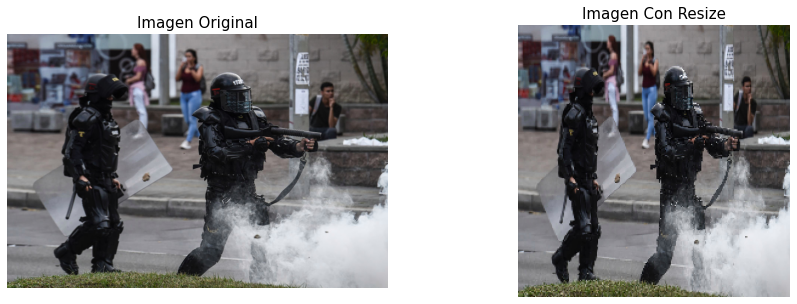

Número de clase de la imagen predicha 652 

Tipo de Dato de Salida: <class 'tensorflow.python.framework.ops.EagerTensor'>


[[('n03763968', 'military_uniform', 0.21188867),
  ('n04090263', 'rifle', 0.08253251),
  ('n03000684', 'chain_saw', 0.07482911),
  ('n02749479', 'assault_rifle', 0.06288046),
  ('n02999410', 'chain', 0.054908264)]]

In [31]:
# https://media.cnnchile.com/sites/2/2021/05/COLOMBIA.jpg
# https://ggia.berkeley.edu/assets/general/GGIA-HumanFace.jpg
# https://cnnespanol.cnn.com/wp-content/uploads/2021/05/GettyImages-1203559048.jpg?quality=100&strip=info&w=1024

url = "https://cnnespanol.cnn.com/wp-content/uploads/2021/05/GettyImages-1203559048.jpg?quality=100&strip=info&w=1024"

r = requests.get(url)
with open("../Data/Patria.jpg", "wb") as f:
    f.write(r.content)

# Ruta de la Imagen
img_path = '../Data/Patria.jpg'

# Cargar Imagen
img = image.load_img(img_path)

# Visualizar Imagen
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Original",fontsize=15)


# Cargar Imagen con resize (Para la Red)
img = image.load_img(img_path,target_size=(224,224))

# Visualizar Imagen
plt.subplot(122)
plt.imshow(img)
plt.axis('off')
plt.title("Imagen Con Resize",fontsize=15)
plt.show()

# Convertir a tensor
x = image.img_to_array(img)
# Expandir dimensión para forma de la red
x = np.expand_dims(x, axis=0)
# Preprocesarmiento del input para ayudar a la red
x = preprocess_input(x)
# Predicciones (Vector de probabilidades)
features = mnet_v3(x)
# Número de clase
clase=np.argmax(features)
print("Número de clase de la imagen predicha",clase,'\n')
# Tipo de datos de salida
print("Tipo de Dato de Salida:",type(features))
# Qué objeto es (note la diferencia con los otrso modelos)
que_es=decode_predictions(np.array(features))
que_es

[[Volver]](#Contenido)

## <span style="color:blue">Predicciones usando OpenCV</span>

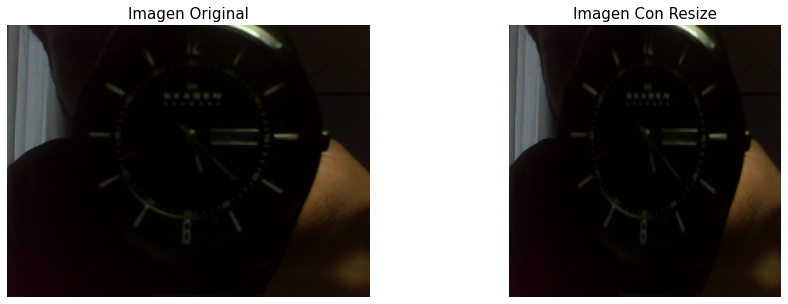

Número de clase de la imagen predicha 409 



[[('n02708093', 'analog_clock', 0.504188),
  ('n04548280', 'wall_clock', 0.07951482),
  ('n04328186', 'stopwatch', 0.035256468),
  ('n03271574', 'electric_fan', 0.025020696),
  ('n03706229', 'magnetic_compass', 0.019196104)]]

In [45]:
import cv2

video_capture = cv2.VideoCapture(0)
# Check success
if not video_capture.isOpened():
    raise Exception("No se pudo abrir el dispositivo de video")
# Read picture. ret === True on success
ret, frame = video_capture.read()
# Close device
video_capture.release()

frameRGB = frame[:,:,::-1] # BGR => RGB
x = cv2.resize(frameRGB,(224,224))

# Visualizar Imagen
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.imshow(frameRGB)
plt.axis('off')
plt.title("Imagen Original",fontsize=15)

# Visualizar Imagen
plt.subplot(122)
plt.imshow(x)
plt.axis('off')
plt.title("Imagen Con Resize",fontsize=15)
plt.show()

# Reescalar la imagen

x = np.expand_dims(x, axis=0)
# Preprocesarmiento del input para ayudar a la red
x = preprocess_input(x)
# Predicciones (Vector de probabilidades)
features = mnet_v3(x)
# Número de clase
clase=np.argmax(features)
print("Número de clase de la imagen predicha",clase,'\n')
# Qué objeto es (note la diferencia con los otrso modelos)
que_es=decode_predictions(np.array(features))
que_es

Todo esto funciona súper bien, pero...

¿Y si quisiéramos hacer una aplicación que se especialice en nuestros propios datos?

¿Qué tal modificar algunas capas de la red y con base en ella entrenar sólo algunos parámetros?

En el siguiente Notebook, se podrán responder estas y más preguntas, bienvenidos a **Transfer Learning**.

[[Volver]](#Contenido)